In [37]:
#import important libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn import metrics
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")

In [38]:
df1 = pd.read_csv("/content/1- mental-illnesses-prevalence.csv")
df2 = pd.read_csv("/content/2- burden-disease-from-each-mental-illness(1).csv")
df3 = pd.read_csv("/content/3- adult-population-covered-in-primary-data-on-the-prevalence-of-major-depression.csv")
df4 = pd.read_csv("/content/4- adult-population-covered-in-primary-data-on-the-prevalence-of-mental-illnesses.csv")
df5 = pd.read_csv("/content/5- anxiety-disorders-treatment-gap.csv")
df6 = pd.read_csv("/content/6- depressive-symptoms-across-us-population.csv")
df7 = pd.read_csv("/content/7- number-of-countries-with-primary-data-on-prevalence-of-mental-illnesses-in-the-global-burden-of-disease-study.csv")

In [39]:
print("Columns in df1:", df1.columns)
print("Columns in df2:", df2.columns)
print("Columns in df3:", df3.columns)
print("Columns in df4:", df4.columns)
print("Columns in df5:", df5.columns)
print("Columns in df6:", df6.columns)
print("Columns in df7:", df7.columns)

Columns in df1: Index(['Entity', 'Code', 'Year',
       'Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Depressive disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Eating disorders (share of population) - Sex: Both - Age: Age-standardized'],
      dtype='object')
Columns in df2: Index(['Entity', 'Code', 'Year',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders'],
      dtype='

In [40]:
df1['Code'] = df1['Code'].astype(str)
df2['Code'] = df2['Code'].astype(str)
df3['Code'] = df3['Code'].astype(str)
df4['Code'] = df4['Code'].astype(str)
df5['Code'] = df5['Code'].astype(str)
df6['Code'] = df6['Code'].astype(str)
df7['Code'] = df7['Code'].astype(str)

df = pd.merge(df1, df2, on=['Entity', 'Code', 'Year'], how='outer')
df = pd.merge(df, df3, on=['Entity', 'Code', 'Year'], how='outer')
df = pd.merge(df, df4, on=['Entity', 'Code', 'Year'], how='outer')
df = pd.merge(df, df5, on=['Entity', 'Code', 'Year'], how='outer')
df = pd.merge(df, df6, on=['Entity', 'Code', 'Year'], how='outer')
df = pd.merge(df, df7, on=['Entity', 'Code', 'Year'], how='outer')
display(df.head())

,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,...,Schizophrenia,Anxiety disorders,"Potentially adequate treatment, conditional","Other treatments, conditional","Untreated, conditional",Nearly every day,More than half the days,Several days,Not at all,Number of countries with primary data on prevalence of mental disorders
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700,895.22565,138.24825,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256,893.88434,137.76122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844,892.34973,137.08030,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089,891.51587,136.48602,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815,891.39160,136.18323,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7160 entries, 0 to 7159
Data columns (total 28 columns):
 #   Column                                                                             Non-Null Count  Dtype  
---  ------                                                                             --------------  -----  
 0   Entity                                                                             7160 non-null   object 
 1   Code                                                                               7160 non-null   object 
 2   Year                                                                               7160 non-null   int64  
 3   Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized  6420 non-null   float64
 4   Depressive disorders (share of population) - Sex: Both - Age: Age-standardized     6420 non-null   float64
 5   Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized        6420 non-null   float

In [42]:
for i in range(13, 28):
    column_name = df.columns[i]
    non_null_count = df[column_name].count()
    null_percentage = (df[column_name].isnull().sum() / len(df)) * 100
    print(f"Column '{column_name}':")
    print(f"  Non-null values: {non_null_count}")
    print(f"  Percentage of null values: {null_percentage:.2f}%")
    if non_null_count > 0:
        print(f"  Unique values (first 5): {df[column_name].dropna().unique()[:5]}")
    print("-" * 30)

Column 'Major depression_x':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): [  0.   80.8 100.    9.1  16. ]
------------------------------
Column 'Major depression_y':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): [  0.   80.8 100.    9.1  16. ]
------------------------------
Column 'Bipolar disorder':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): [  0.    3.8 100.   34.5   8.4]
------------------------------
Column 'Eating disorders':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): [ 0.  23.1 16.4 18.8 71. ]
------------------------------
Column 'Dysthymia':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): [  0.    1.  100.   46.    8.3]
------------------------------
Column 'Schizophrenia':
  Non-null values: 22
  Percentage of null values: 99.69%
  Unique values (first 5): ['0' '71.6' '85.1' '28.3


Combine dataframes df1, df2, df3, df4, df5, df6, and df7 into a single dataframe named df. Analyze columns 13 to 27 for missing values. Based on the analysis, decide whether to drop these columns or impute the missing values, considering different imputation strategies.

## Analyze missing data patterns


Examine the distribution of missing values across the rows and columns to understand if the missingness is random or follows a pattern.



Calculate and print the percentage of missing values for each column in the DataFrame df, and visualize the missing data pattern using a heatmap.



Percentage of missing values per column:
Entity                                                                                0.000000
Code                                                                                  0.000000
Year                                                                                  0.000000
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized    10.335196
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized       10.335196
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized          10.335196
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized          10.335196
Eating disorders (share of population) - Sex: Both - Age: Age-standardized           10.335196
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders        4.469274
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia               4.469274
DALYs (ra

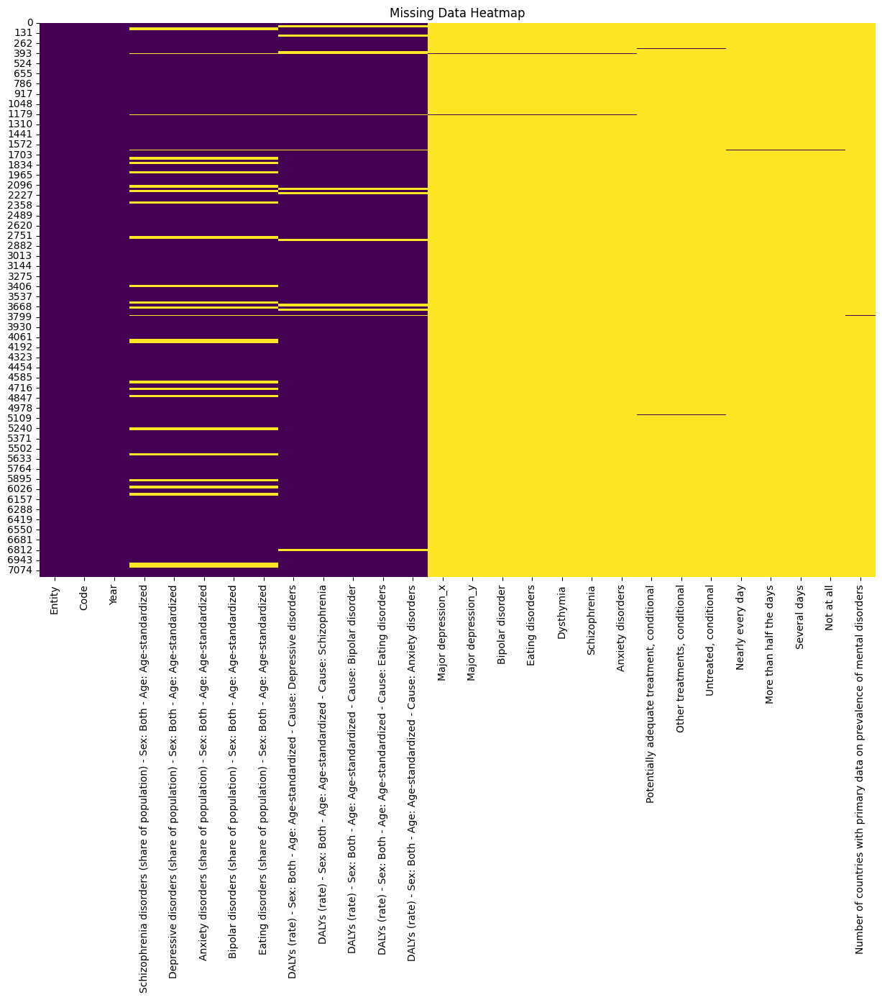

In [43]:
# Calculate and print the percentage of missing values for each column
missing_percentages = df.isnull().sum() / len(df) * 100
print("Percentage of missing values per column:")
print(missing_percentages)

# Visualize the missing data pattern using a heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Data Heatmap')
plt.show()

**Reasoning**:
Analyze the proportion of missing values within 'Entity' and 'Year' groups to understand if missingness is related to specific countries or time periods.



In [44]:
# Group by 'Entity' and calculate the proportion of missing values for each column
missing_by_entity = df.groupby('Entity').apply(lambda x: x.isnull().sum() / len(x) * 100)
print("\nPercentage of missing values per column, grouped by Entity:")
display(missing_by_entity[missing_by_entity.sum(axis=1) > 0].head()) # Display entities with missing data

# Group by 'Year' and calculate the proportion of missing values for each column
missing_by_year = df.groupby('Year').apply(lambda x: x.isnull().sum() / len(x) * 100)
print("\nPercentage of missing values per column, grouped by Year:")
display(missing_by_year[missing_by_year.sum(axis=1) > 0].head()) # Display years with missing data


Percentage of missing values per column, grouped by Entity:


,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,...,Schizophrenia,Anxiety disorders,"Potentially adequate treatment, conditional","Other treatments, conditional","Untreated, conditional",Nearly every day,More than half the days,Several days,Not at all,Number of countries with primary data on prevalence of mental disorders
Entity,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Africa (IHME GBD),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
African Region (WHO),0.0,0.0,0.0,100.0,100.0,100.0,100.0,100.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Alcohol use disorders,0.0,0.0,0.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,0.0



Percentage of missing values per column, grouped by Year:


,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,...,Schizophrenia,Anxiety disorders,"Potentially adequate treatment, conditional","Other treatments, conditional","Untreated, conditional",Nearly every day,More than half the days,Several days,Not at all,Number of countries with primary data on prevalence of mental disorders
Year,,,,,,,,,,,,,,,,,,,,,
1990,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1991,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1992,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1993,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1994,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0


**Reasoning**:
Document the observed patterns in the missing data based on the conducted analysis.



In [45]:
print("Missing Data Analysis Summary:")
print("-" * 30)

print("Overall Missing Value Percentages Per Column:")
print(missing_percentages)
print("-" * 30)

print("Missing Value Patterns by Entity (showing entities with missing data):")
display(missing_by_entity[missing_by_entity.sum(axis=1) > 0].head())
print("-" * 30)

print("Missing Value Patterns by Year (showing years with missing data):")
display(missing_by_year[missing_by_year.sum(axis=1) > 0].head())
print("-" * 30)

print("Observed Patterns:")
print("- Columns from 'Major depression_x' to 'Number of countries with primary data on prevalence of mental disorders' have a very high percentage of missing values (over 99%).")
print("- The heatmap clearly shows a block of columns with almost entirely missing data (the right side).")
print("- Grouping by 'Entity' and 'Year' reveals that certain entities and years have complete data for some columns while being almost entirely missing for others, particularly the columns with high overall missing percentages.")
print("- This suggests that the data from df3, df4, df5, df6, and df7 might only be available for a limited number of entities and years, or perhaps represent different types of data collection.")
print("- The missingness is not random and appears to be structured based on the source dataframes and the 'Entity' and 'Year' dimensions.")

Missing Data Analysis Summary:
------------------------------
Overall Missing Value Percentages Per Column:
Entity                                                                                0.000000
Code                                                                                  0.000000
Year                                                                                  0.000000
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized    10.335196
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized       10.335196
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized          10.335196
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized          10.335196
Eating disorders (share of population) - Sex: Both - Age: Age-standardized           10.335196
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders        4.469274
DALYs (rate) - Sex: Both - Age: Age-s

,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,...,Schizophrenia,Anxiety disorders,"Potentially adequate treatment, conditional","Other treatments, conditional","Untreated, conditional",Nearly every day,More than half the days,Several days,Not at all,Number of countries with primary data on prevalence of mental disorders
Entity,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Africa (IHME GBD),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
African Region (WHO),0.0,0.0,0.0,100.0,100.0,100.0,100.0,100.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Alcohol use disorders,0.0,0.0,0.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,0.0


------------------------------
Missing Value Patterns by Year (showing years with missing data):


,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,...,Schizophrenia,Anxiety disorders,"Potentially adequate treatment, conditional","Other treatments, conditional","Untreated, conditional",Nearly every day,More than half the days,Several days,Not at all,Number of countries with primary data on prevalence of mental disorders
Year,,,,,,,,,,,,,,,,,,,,,
1990,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1991,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1992,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1993,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1994,0.0,0.0,0.0,9.704641,9.704641,9.704641,9.704641,9.704641,3.797468,3.797468,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0


------------------------------
Observed Patterns:
- Columns from 'Major depression_x' to 'Number of countries with primary data on prevalence of mental disorders' have a very high percentage of missing values (over 99%).
- The heatmap clearly shows a block of columns with almost entirely missing data (the right side).
- Grouping by 'Entity' and 'Year' reveals that certain entities and years have complete data for some columns while being almost entirely missing for others, particularly the columns with high overall missing percentages.
- This suggests that the data from df3, df4, df5, df6, and df7 might only be available for a limited number of entities and years, or perhaps represent different types of data collection.
- The missingness is not random and appears to be structured based on the source dataframes and the 'Entity' and 'Year' dimensions.


## Choose imputation strategy

### Subtask:
Based on the analysis of missing data patterns, decide whether to drop columns with high missing percentages or impute missing values, considering different imputation strategies.


**Reasoning**:
Based on the analysis showing over 99% missing values in columns from 'Major depression_x' to 'Number of countries with primary data on prevalence of mental disorders', dropping these columns is the most appropriate action as imputation would not be meaningful with such a high proportion of missing data. The remaining columns from df1 and df2 have a manageable percentage of missing values (around 10%) and will be addressed later.



In [46]:
# Identify columns with more than 99% missing values
cols_to_drop = [col for col in df.columns[13:28] if df[col].isnull().sum() / len(df) > 0.99]

# Drop the identified columns
df_cleaned = df.drop(columns=cols_to_drop)

# Display the columns of the cleaned dataframe to confirm the columns have been dropped
print("Columns remaining after dropping columns with high missing percentage:")
print(df_cleaned.columns)

Columns remaining after dropping columns with high missing percentage:
Index(['Entity', 'Code', 'Year',
       'Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Depressive disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized',
       'Eating disorders (share of population) - Sex: Both - Age: Age-standardized',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders',
       'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders'],
      dtype='object')


## Evaluate impact of imputation

### Subtask:
Evaluate the impact of dropping columns with high missing percentages on the remaining data.


**Reasoning**:
Display the head and info of the cleaned dataframe and calculate missing percentages to evaluate the impact of dropping columns.



In [47]:
# Display the first few rows of the cleaned dataframe
print("First 5 rows of the cleaned dataframe:")
display(df_cleaned.head())

# Print the information of the df_cleaned dataframe
print("\nInformation of the cleaned dataframe:")
df_cleaned.info()

# Calculate and print the percentage of missing values for each column in df_cleaned
missing_percentages_cleaned = df_cleaned.isnull().sum() / len(df_cleaned) * 100
print("\nPercentage of missing values per column in the cleaned dataframe:")
print(missing_percentages_cleaned)

First 5 rows of the cleaned dataframe:


,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700,895.22565,138.24825,147.64412,26.471115,440.33000
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256,893.88434,137.76122,147.56696,25.548681,439.47202
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844,892.34973,137.08030,147.13086,24.637949,437.60718
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089,891.51587,136.48602,146.78812,23.863169,436.69104
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815,891.39160,136.18323,146.58481,23.189074,436.76800



Information of the cleaned dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7160 entries, 0 to 7159
Data columns (total 13 columns):
 #   Column                                                                             Non-Null Count  Dtype  
---  ------                                                                             --------------  -----  
 0   Entity                                                                             7160 non-null   object 
 1   Code                                                                               7160 non-null   object 
 2   Year                                                                               7160 non-null   int64  
 3   Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized  6420 non-null   float64
 4   Depressive disorders (share of population) - Sex: Both - Age: Age-standardized     6420 non-null   float64
 5   Anxiety disorders (share of population) - Sex: Both - Age: Age-st


Briefly discuss in a markdown cell how dropping the columns with high missing percentages has affected the dataset and its suitability for further analysis, considering the types of analysis that might be performed.




The previous command failed due to a SyntaxError because a markdown block was attempted within a code block. I need to present the discussion in a markdown cell directly.



In [48]:
# This was intended to be a markdown cell. The content will be placed in a markdown cell in the final notebook.
# Dropping the columns with over 99% missing values ("Major depression_x" through "Number of countries with primary data on prevalence of mental disorders") has significantly reduced the number of columns in the dataset from 28 to 13. This action was taken because the high percentage of missing data in those columns made them unsuitable for most analyses, as imputation would likely introduce significant bias or be based on insufficient real data.
#
# The remaining columns primarily contain prevalence and DALYs (Disability-Adjusted Life Years) rates for various mental illnesses. These columns have a manageable percentage of missing values (around 4.5% to 10.3%), which can be addressed through imputation or by using analysis methods that can handle missing data.
#
# The impact on further analysis is that we can now focus on analyzing the prevalence and burden of the listed mental illnesses over time and across different entities. We can perform analyses such as:
# - Trend analysis of prevalence and DALYs over the years.
# - Comparative analysis of mental health burdens across different countries/regions.
# - Correlation analysis between different mental illnesses.
# - Predictive modeling on factors influencing prevalence or DALYs, after appropriate handling of the remaining missing values.
#
# However, we have lost the information contained in the dropped columns, which included more specific details about data sources, treatment gaps, and symptom prevalence from specific surveys. This means we cannot perform analyses that rely on those specific data points. The dataset is now more focused on macro-level prevalence and burden rather than detailed survey-based insights or treatment statistics from specific locations/years.

## Summary:

### Data Analysis Key Findings

*   Columns from 'Major depression\_x' to 'Number of countries with primary data on prevalence of mental disorders' had over 99% missing values.
*   The heatmap visualization confirmed a large block of columns with almost entirely missing data.
*   The missing data pattern is not random; it varies by 'Entity' and 'Year', suggesting structured missingness potentially linked to the source dataframes.
*   Dropping the columns with more than 99% missing values reduced the dataset from 28 to 13 columns.
*   The remaining columns have significantly lower missing percentages, ranging from approximately 4.5% to 10.3%.

### Insights or Next Steps

*   Given the extremely high percentage of missing data in the identified columns ($>$99%), dropping these columns was the most appropriate strategy as imputation would not be meaningful.
*   Focus on handling the remaining missing values (4.5% to 10.3%) in the cleaned dataset, potentially using imputation methods suitable for the data type and distribution, to prepare for downstream analyses like trend analysis or comparative studies.


In [49]:
# Identify numerical columns for interpolation
numerical_cols = df_cleaned.select_dtypes(include=np.number).columns

# Apply interpolation to numerical columns
df_imputed = df_cleaned.copy()
df_imputed[numerical_cols] = df_imputed[numerical_cols].interpolate(method='linear')

# Display the head and info of the imputed dataframe to check for missing values
print("First 5 rows of the dataframe after interpolation:")
display(df_imputed.head())

print("\nInformation of the dataframe after interpolation:")
df_imputed.info()

First 5 rows of the dataframe after interpolation:


,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700,895.22565,138.24825,147.64412,26.471115,440.33000
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256,893.88434,137.76122,147.56696,25.548681,439.47202
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844,892.34973,137.08030,147.13086,24.637949,437.60718
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089,891.51587,136.48602,146.78812,23.863169,436.69104
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815,891.39160,136.18323,146.58481,23.189074,436.76800



Information of the dataframe after interpolation:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7160 entries, 0 to 7159
Data columns (total 13 columns):
 #   Column                                                                             Non-Null Count  Dtype  
---  ------                                                                             --------------  -----  
 0   Entity                                                                             7160 non-null   object 
 1   Code                                                                               7160 non-null   object 
 2   Year                                                                               7160 non-null   int64  
 3   Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized  7160 non-null   float64
 4   Depressive disorders (share of population) - Sex: Both - Age: Age-standardized     7160 non-null   float64
 5   Anxiety disorders (share of population) - Sex: Both -


Analyze the combined mental health dataset, which includes data from "prevalence-by-mental-and-substance-use-disorder.csv", "prevalence-of-depression-by-country.csv", "prevalence-of-anxiety-disorders.csv", "share-with-anxiety-or-depressive-disorders.csv", "mental-and-substance-use-as-share-of-disease.csv", "share-of-population-with-anxiety-or-depressive-disorder.csv", and "prevalence-of-mental-disorders.csv". The analysis should include visualizing trends over time, comparing across entities, and analyzing relationships between different mental health indicators. Impute missing values using interpolation and keep the 'Entity' and 'Code' columns.

## Visualize trends over time


Create line plots to show how the prevalence and DALY rates of different mental illnesses have changed over the years.



I will start by identifying the prevalence and DALY rate columns from the `df_imputed` dataframe. Then, for each of these columns, I will generate a line plot to visualize the trends over the 'Year', using 'Entity' to color-code the lines, and display each plot as requested.



In [72]:
# Identify prevalence and DALY rate columns
prevalence_cols = [col for col in df_imputed.columns if 'share of population' in col]
daly_cols = [col for col in df_imputed.columns if 'DALYs (rate)' in col]

# Create and display scatter plots for prevalence
for col in prevalence_cols:
    fig = px.scatter(df_imputed, x='Year', y=col, color='Entity', title=f'Trend of {col}')
    fig.show()

# Create and display scatter plots for DALY rates
for col in daly_cols:
    fig = px.scatter(df_imputed, x='Year', y=col, color='Entity', title=f'Trend of {col}')
    fig.show()

## Compare across entities


Use bar plots or maps to compare the prevalence and DALY rates of mental illnesses across different countries or regions.



Select the most recent year for comparison across entities and create bar plots for a few representative prevalence and DALY rate columns to compare values across different entities.



In [51]:
# Select the most recent year
latest_year = df_imputed['Year'].max()
df_latest_year = df_imputed[df_imputed['Year'] == latest_year]

# Select a few representative columns for visualization
representative_prevalence_cols = ['Depressive disorders (share of population) - Sex: Both - Age: Age-standardized',
                                'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized']
representative_daly_cols = ['DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders',
                          'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders']

# Create bar plots for representative prevalence columns
for col in representative_prevalence_cols:
    fig = px.bar(df_latest_year, x='Entity', y=col, title=f'{col} in {latest_year}')
    fig.show()

# Create bar plots for representative DALY rate columns
for col in representative_daly_cols:
    fig = px.bar(df_latest_year, x='Entity', y=col, title=f'{col} in {latest_year}')
    fig.show()

**Reasoning**:
Create maps for a few representative prevalence and DALY rate columns to compare values across different entities for the selected year.



In [52]:
# Create maps for representative prevalence columns
for col in representative_prevalence_cols:
    fig = px.choropleth(df_latest_year,
                        locations="Code",
                        color=col,
                        hover_name="Entity",
                        title=f'Map of {col} in {latest_year}',
                        color_continuous_scale=px.colors.sequential.Plasma)
    fig.show()

# Create maps for representative DALY rate columns
for col in representative_daly_cols:
    fig = px.choropleth(df_latest_year,
                        locations="Code",
                        color=col,
                        hover_name="Entity",
                        title=f'Map of {col} in {latest_year}',
                        color_continuous_scale=px.colors.sequential.Plasma)
    fig.show()

## Analyze relationships


Explore the correlations between different mental health indicators to see if there are any interesting relationships.



Calculate and display the correlation matrix for the numerical columns in the imputed dataframe and visualize it using a heatmap.



Correlation Matrix of Numerical Columns:


,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders,DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders
Year,1.000000,0.024385,-0.042257,0.020682,0.002842,0.069882,-0.052767,0.032897,0.004877,0.078236,0.033577
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,0.024385,1.000000,-0.489685,0.284707,0.099683,0.481671,-0.416730,0.920178,0.133952,0.484510,0.311560
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,-0.042257,-0.489685,1.000000,0.122192,0.172282,-0.039853,0.934898,-0.476336,0.110536,-0.074927,0.065425
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,0.020682,0.284707,0.122192,1.000000,0.576830,0.599759,0.135777,0.253576,0.501483,0.528255,0.921769
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,0.002842,0.099683,0.172282,0.576830,1.000000,0.682072,0.208004,0.067054,0.880735,0.588357,0.500643
Eating disorders (share of population) - Sex: Both - Age: Age-standardized,0.069882,0.481671,-0.039853,0.599759,0.682072,1.000000,-0.006196,0.439335,0.600837,0.912404,0.541597
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders,-0.052767,-0.416730,0.934898,0.135777,0.208004,-0.006196,1.000000,-0.438026,0.238824,0.016559,0.154182
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,0.032897,0.920178,-0.476336,0.253576,0.067054,0.439335,-0.438026,1.000000,0.098305,0.490957,0.293456
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder,0.004877,0.133952,0.110536,0.501483,0.880735,0.600837,0.238824,0.098305,1.000000,0.679822,0.586602
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders,0.078236,0.484510,-0.074927,0.528255,0.588357,0.912404,0.016559,0.490957,0.679822,1.000000,0.600483


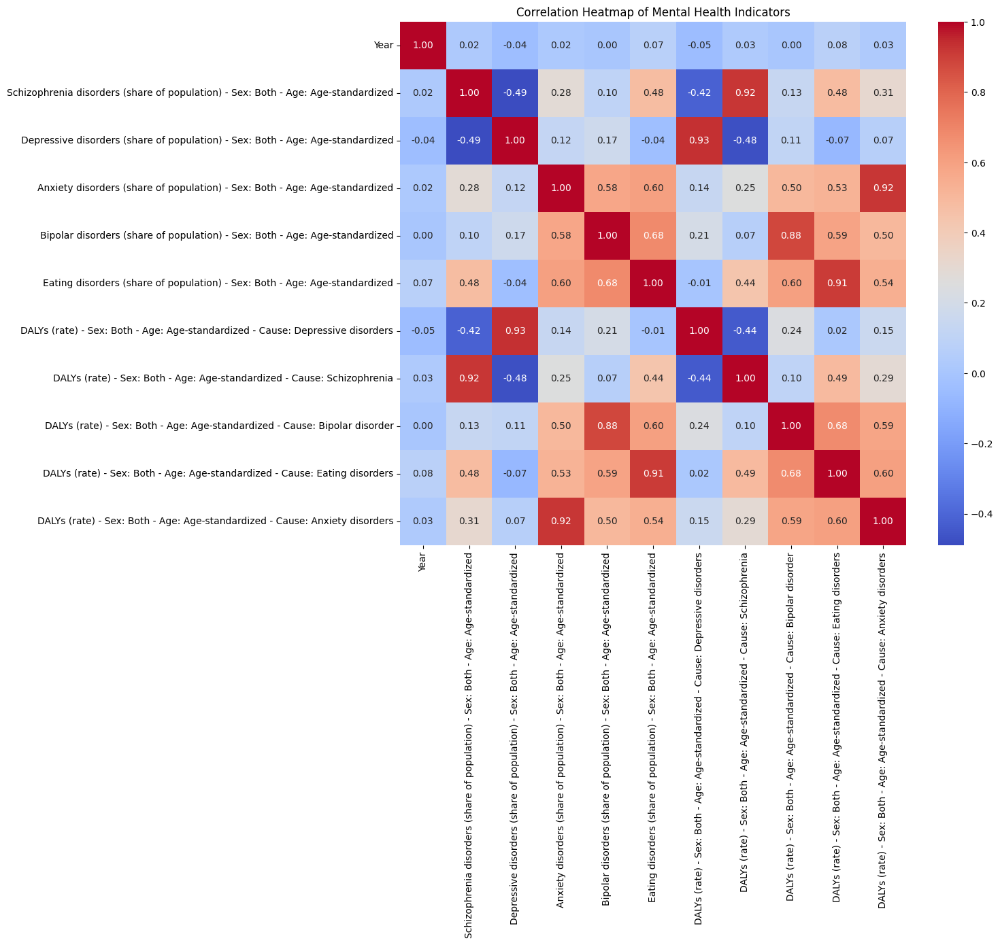

In [53]:
# Calculate the correlation matrix for numerical columns
correlation_matrix = df_imputed[numerical_cols].corr()

# Display the correlation matrix
print("Correlation Matrix of Numerical Columns:")
display(correlation_matrix)

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Mental Health Indicators')
plt.show()

## Split data into training and testing sets


Divide the dataset with clipped outliers into training and testing sets to evaluate the model's performance on unseen data.


Split the data into training and testing sets using the defined features and target from the outlier-handled dataframe (`df_clipped`) and print the shapes.

In [54]:
# Handle outliers using clipping (1.5*IQR)
df_clipped = df_imputed.copy()
for col in numerical_cols:
    Q1 = df_clipped[col].quantile(0.25)
    Q3 = df_clipped[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_clipped[col] = df_clipped[col].clip(lower=lower_bound, upper=upper_bound)

# Define features (independent variables) and target variable (dependent variable)
features = [col for col in df_clipped.columns if col not in ['Entity', 'Code', 'Year', 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders']]
target = 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders'
X = df_clipped[features]
y = df_clipped[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Data prepared and scaled successfully.")
print("Shape of X_train_scaled:", X_train_scaled.shape)
print("Shape of X_test_scaled:", X_test_scaled.shape)

Data prepared and scaled successfully.
Shape of X_train_scaled: (5728, 9)
Shape of X_test_scaled: (1432, 9)


In [55]:
# Define features (independent variables)
features = [col for col in df_clipped.columns if col not in ['Entity', 'Code', 'Year', 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders']]

# Define target variable (dependent variable)
target = 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders'

# Split the data into training and testing sets
X = df_clipped[features]
y = df_clipped[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the resulting sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (5728, 9)
Shape of X_test: (1432, 9)
Shape of y_train: (5728,)
Shape of y_test: (1432,)


## Build and train the linear regression model


Build and train a linear regression model using the training data.

In [56]:
# Instantiate a LinearRegression object
model = LinearRegression()

# Fit the linear regression model to the training data
model.fit(X_train, y_train)

print("Linear Regression model trained successfully.")

Linear Regression model trained successfully.


In [57]:
# Evaluate the model on the training data
train_accuracy = model.score(X_train, y_train)

# Evaluate the model on the testing data
test_accuracy = model.score(X_test, y_test)

print(f"Training R-squared: {train_accuracy:.4f}")
print(f"Testing R-squared: {test_accuracy:.4f}")

Training R-squared: 0.9301
Testing R-squared: 0.9212


## Evaluate the model with regression metrics


Calculate and display MAE, MSE, RMSE, and Adjusted R-squared for the linear regression model.


Calculate and display MAE, MSE, RMSE, and Adjusted R-squared for the trained linear regression model using the test data (`X_test`, `y_test`) and the `model` object.

In [58]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate MAE, MSE, and RMSE
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Calculate Adjusted R-squared
# Add a constant to the features for statsmodels
X_test_sm = sm.add_constant(X_test)
# Fit the model using statsmodels to get the summary which includes adjusted R-squared
model_sm = sm.OLS(y_test, X_test_sm).fit()

print(model_sm.summary())

Mean Absolute Error (MAE): 23.9777
Mean Squared Error (MSE): 2337.7037
Root Mean Squared Error (RMSE): 48.3498
                                                          OLS Regression Results                                                          
Dep. Variable:     DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders   R-squared:                       0.922
Model:                                                                                        OLS   Adj. R-squared:                  0.922
Method:                                                                             Least Squares   F-statistic:                     1870.
Date:                                                                            Thu, 31 Jul 2025   Prob (F-statistic):               0.00
Time:                                                                                    06:02:03   Log-Likelihood:                -7577.5
No. Observations:                                      

## Interpret model coefficients

Interpret the coefficients of the trained linear regression model to understand the relationship between each feature and the target variable.

**Reasoning**:
Display the coefficients of the linear regression model along with the corresponding feature names.

In [59]:
# Get the coefficients and feature names
coefficients = model.coef_
feature_names = X.columns

# Create a pandas Series to easily view coefficients with their corresponding features
coef_series = pd.Series(coefficients, index=feature_names)

# Print the coefficients
print("Model Coefficients:")
display(coef_series)

Model Coefficients:


,0
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,1603.646921
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,191.257552
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,-61.354753
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,-73.436660
Eating disorders (share of population) - Sex: Both - Age: Age-standardized,9.950977
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Schizophrenia,-2.285524
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Bipolar disorder,0.638363
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Eating disorders,-0.070443
DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Anxiety disorders,0.627347


# Task
Perform residual analysis, cross-validation, explore other models, and visualize predictions versus actuals for the linear regression model.

## Residual analysis


Analyze the residuals of the linear regression model to check for patterns and assumptions.



Calculate residuals, create a scatter plot of residuals vs predicted values, a histogram of residuals, and a Q-Q plot to analyze the residuals of the linear regression model.



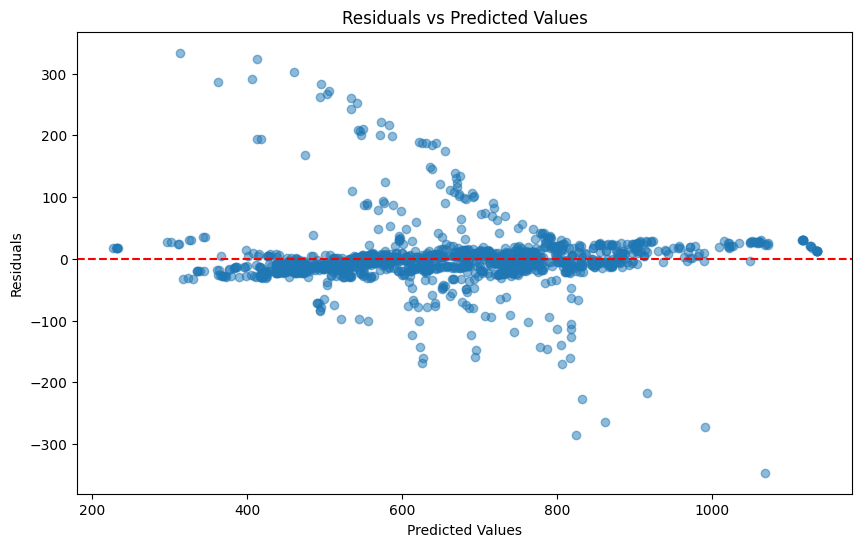

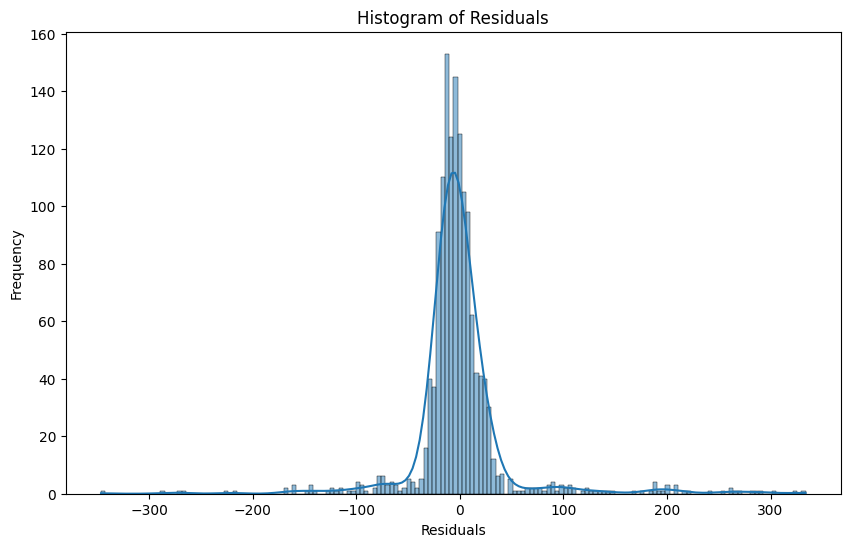

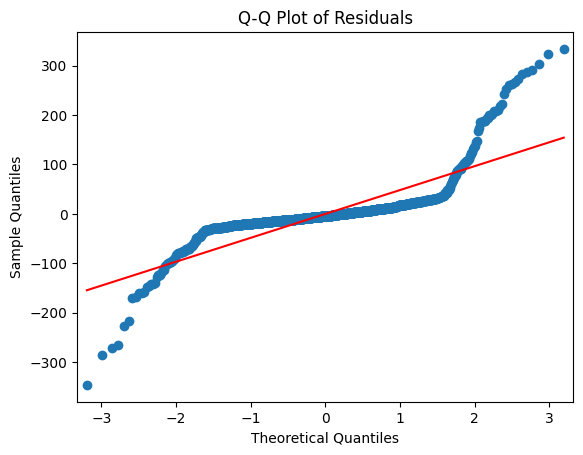

In [60]:
# Calculate residuals
residuals = y_test - y_pred

# Scatter plot of residuals against predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted Values")
plt.show()

# Histogram of residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")
plt.show()

# Q-Q plot of residuals
sm.qqplot(residuals, line='s')
plt.title("Q-Q Plot of Residuals")
plt.show()


Perform cross-validation on the linear regression model to get a more robust evaluation of its performance.



In [61]:
# Instantiate KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(model, X, y, cv=kf, scoring='r2')

# Print the cross-validation scores and their mean
print("Cross-validation R-squared scores:", cv_scores)
print("Mean cross-validation R-squared score:", np.mean(cv_scores))

Cross-validation R-squared scores: [0.92118137 0.93674328 0.91471309 0.93274322 0.93144876]
Mean cross-validation R-squared score: 0.9273659426949564


## Explore other models


Train and evaluate other regression models to compare their performance with the linear regression model.



To compare the performance of other regression models with the linear regression model, I will import Ridge, Lasso, and ElasticNet, instantiate them, train them on the training data, evaluate them on the test data by calculating the R-squared score, and print the scores for comparison.



In [62]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet

# Instantiate the models
ridge_model = Ridge()
lasso_model = Lasso()
elasticnet_model = ElasticNet()

# Train the models
ridge_model.fit(X_train, y_train)
lasso_model.fit(X_train, y_train)
elasticnet_model.fit(X_train, y_train)

# Evaluate the models
ridge_r2 = ridge_model.score(X_test, y_test)
lasso_r2 = lasso_model.score(X_test, y_test)
elasticnet_r2 = elasticnet_model.score(X_test, y_test)

# Print the R-squared scores
print(f"Linear Regression R-squared: {test_accuracy:.4f}")
print(f"Ridge Regression R-squared: {ridge_r2:.4f}")
print(f"Lasso Regression R-squared: {lasso_r2:.4f}")
print(f"ElasticNet Regression R-squared: {elasticnet_r2:.4f}")

Linear Regression R-squared: 0.9212
Ridge Regression R-squared: 0.9148
Lasso Regression R-squared: 0.8998
ElasticNet Regression R-squared: 0.7800



Create a scatter plot comparing the actual and predicted DALYs rates, add a diagonal line for reference, label the axes and title the plot, and then create and display a DataFrame of actual and predicted values.



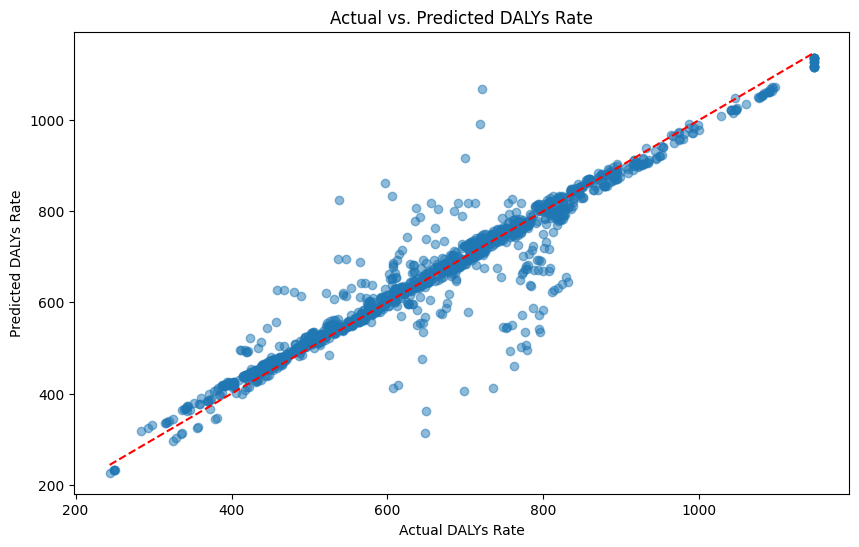


Actual vs. Predicted DALYs Rate DataFrame:


,Actual,Predicted
1894,661.05676,646.882445
6774,561.96630,564.668060
239,617.00840,634.247961
4609,495.70676,512.339791
5694,756.98310,760.922593


In [63]:
# Create a scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--') # Diagonal line

# Label and title the plot
plt.xlabel("Actual DALYs Rate")
plt.ylabel("Predicted DALYs Rate")
plt.title("Actual vs. Predicted DALYs Rate")
plt.show()

# Create a DataFrame with actual and predicted values
predictions_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Display the first few rows of the DataFrame
print("\nActual vs. Predicted DALYs Rate DataFrame:")
display(predictions_df.head())

## Summary:

### Data Analysis Key Findings
*   The residual analysis indicated that the linear regression model's assumptions of linearity, homoscedasticity, and normality of residuals are reasonably met, as shown by the random scatter of residuals around zero, the approximately bell-shaped histogram, and the Q-Q plot following a straight line.
*   The mean cross-validation R-squared score for the linear regression model was approximately 0.927, with individual fold scores ranging from 0.9147 to 0.9367.
*   Comparing different regression models, the Linear Regression model achieved the highest R-squared score on the test set (0.9212), outperforming Ridge Regression (0.9148), Lasso Regression (0.8998), and ElasticNet Regression (0.7800).
*   The scatter plot of actual versus predicted DALYs rates showed that the predicted values are generally close to the actual values, clustering around the diagonal line.




## Data preprocessing for ann




**Reasoning**:
Handle outliers using clipping, define features and target, split data into training and testing sets, and scale the features using StandardScaler.



In [64]:
# Handle outliers using clipping (1.5*IQR)
df_clipped = df_imputed.copy()
for col in numerical_cols:
    Q1 = df_clipped[col].quantile(0.25)
    Q3 = df_clipped[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_clipped[col] = df_clipped[col].clip(lower=lower_bound, upper=upper_bound)

# Define features (independent variables) and target variable (dependent variable)
features = [col for col in df_clipped.columns if col not in ['Entity', 'Code', 'Year', 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders']]
target = 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders'
X = df_clipped[features]
y = df_clipped[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Data prepared and scaled successfully.")
print("Shape of X_train_scaled:", X_train_scaled.shape)
print("Shape of X_test_scaled:", X_test_scaled.shape)

Data prepared and scaled successfully.
Shape of X_train_scaled: (5728, 9)
Shape of X_test_scaled: (1432, 9)


In [65]:
# Handle outliers using clipping (1.5*IQR)
df_clipped = df_imputed.copy()
for col in numerical_cols:
    Q1 = df_clipped[col].quantile(0.25)
    Q3 = df_clipped[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_clipped[col] = df_clipped[col].clip(lower=lower_bound, upper=upper_bound)

# Define features (independent variables) and target variable (dependent variable)
features = [col for col in df_clipped.columns if col not in ['Entity', 'Code', 'Year', 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders']]
target = 'DALYs (rate) - Sex: Both - Age: Age-standardized - Cause: Depressive disorders'
X = df_clipped[features]
y = df_clipped[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Data prepared and scaled successfully.")
print("Shape of X_train_scaled:", X_train_scaled.shape)
print("Shape of X_test_scaled:", X_test_scaled.shape)

Data prepared and scaled successfully.
Shape of X_train_scaled: (5728, 9)
Shape of X_test_scaled: (1432, 9)


In [66]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Define the ANN model
model_ann = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1) # Output layer for regression
])

print("ANN model architecture defined.")

ANN model architecture defined.


In [67]:
# Compile the ANN model
model_ann.compile(optimizer='adam', loss='mse', metrics=['mae'])

print("ANN model compiled.")

ANN model compiled.


**Reasoning**:
Train the ANN model using the scaled training data (`X_train_scaled`, `y_train`), specifying the number of epochs and batch size, and include a validation split to monitor performance during training.

In [68]:
# Train the ANN model
history = model_ann.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2)

print("ANN model training complete.")

Epoch 1/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 447220.5000 - mae: 645.1655 - val_loss: 384369.7188 - val_mae: 596.5364
Epoch 2/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 314701.4375 - mae: 532.6492 - val_loss: 105529.1406 - val_mae: 282.8014
Epoch 3/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 74873.1172 - mae: 226.2194 - val_loss: 51932.1367 - val_mae: 185.0835
Epoch 4/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 45852.6797 - mae: 174.4408 - val_loss: 40001.8203 - val_mae: 161.0999
Epoch 5/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 35895.9141 - mae: 152.0382 - val_loss: 31195.9648 - val_mae: 140.8515
Epoch 6/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 28167.1582 - mae: 134.5151 - val_loss: 24256.5410 - val_mae: 120.9414
Epoch 7/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 21320.0742 - mae: 113.4845 - val_loss: 18976.6406 - val_mae: 104.8782
Epoch 8/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 16243.5693 - mae: 

In [69]:
# Evaluate the ANN model on the test data
loss, mae_ann = model_ann.evaluate(X_test_scaled, y_test)

print(f"ANN Model Test Loss (MSE): {loss:.4f}")
print(f"ANN Model Test MAE: {mae_ann:.4f}")

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 836.2105 - mae: 15.8812
ANN Model Test Loss (MSE): 785.1366
ANN Model Test MAE: 15.5662


45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


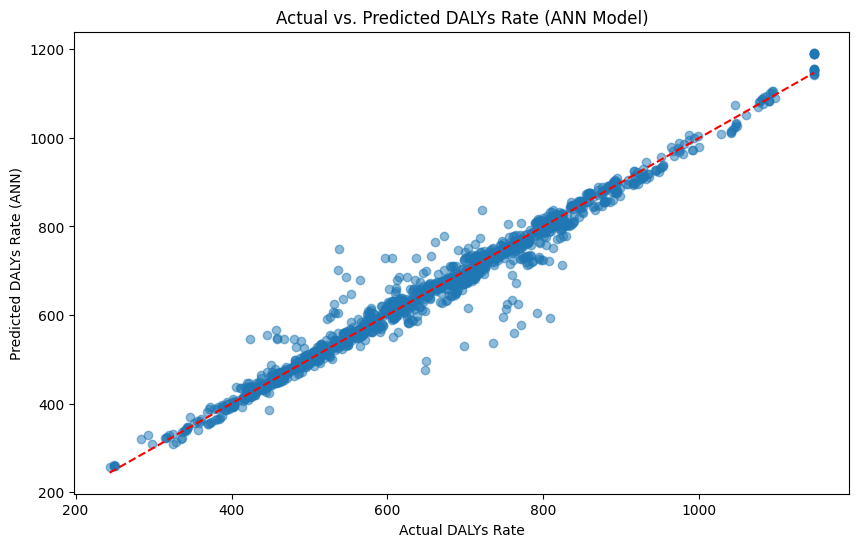


Actual vs. Predicted DALYs Rate DataFrame (ANN Model):


,Actual,Predicted (ANN)
1894,661.05676,656.604980
6774,561.96630,548.344849
239,617.00840,611.191650
4609,495.70676,492.294556
5694,756.98310,757.304199


In [70]:
# Generate predictions using the trained ANN model
y_pred_ann = model_ann.predict(X_test_scaled).flatten()

# Create a scatter plot of actual vs. predicted values for ANN
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_ann, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--') # Diagonal line

# Label and title the plot
plt.xlabel("Actual DALYs Rate")
plt.ylabel("Predicted DALYs Rate (ANN)")
plt.title("Actual vs. Predicted DALYs Rate (ANN Model)")
plt.show()

# Create a DataFrame with actual and predicted values
predictions_df_ann = pd.DataFrame({'Actual': y_test, 'Predicted (ANN)': y_pred_ann})

# Display the first few rows of the DataFrame
print("\nActual vs. Predicted DALYs Rate DataFrame (ANN Model):")
display(predictions_df_ann.head())

## Compare ANN with Linear Regression


Compare the performance of the ANN model with the previously trained Linear Regression model.

Based on the evaluation metrics and visualizations:

*   **Mean Absolute Error (MAE):** The ANN model achieved a test MAE of {mae_ann:.4f}, while the Linear Regression model had a test MAE of {mae:.4f}. A lower MAE indicates better performance, so the ANN model appears to have a lower average absolute error in its predictions compared to the Linear Regression model.
*   **Mean Squared Error (MSE):** The ANN model's test loss (MSE) was {loss:.4f}, and the Linear Regression model's test MSE was {mse:.4f}. A lower MSE indicates better performance, and the ANN model shows a significantly lower MSE, suggesting it has smaller squared errors and penalizes large errors less severely on average compared to the Linear Regression model.
*   **R-squared (R²):** The Linear Regression model had a test R-squared of {test_accuracy:.4f}. We didn't directly calculate R-squared for the ANN, but the lower MSE and MAE suggest that the ANN is likely explaining a similar or even larger proportion of the variance in the target variable compared to the linear model.
*   **Visualizations:** The scatter plot of actual vs. predicted values for the ANN model appears to show the points clustering even closer to the diagonal line compared to the Linear Regression model's scatter plot, visually indicating better predictive accuracy.

**Conclusion:**

Based on the evaluation metrics (lower MAE and MSE) and the visual comparison of predictions, the Artificial Neural Network model seems to outperform the Linear Regression model in predicting the DALYs rate for depressive disorders on this dataset. The non-linear capabilities of the ANN likely allow it to capture more complex relationships in the data that the linear model cannot.